#**Step0: Install geopandas package**
Using geopandas is to read vector-based spatial data format including ESRI shapefile, in this case I added Chicago shapefile boundary to overlay in based map. [Geopandas documentation](https://geopandas.org/en/stable/)

In [38]:
# Is there a reason you did this here this way and not including in the environment?
pip install geopandas

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


#**Step1: Initialize folium map by adding based map and boundary shapefile**
Folium is used for creating map and we use the Map() function to create a map by giving latitude and longitude information to the function. In this case I entered the approximate latitude and longitude of Chicago. To adjust shapfile, I call upon folium.geojson and pass in a few parameters such as weight, dashArray, opacity or color. [Folium documentation](https://python-visualization.github.io/folium/)

In [39]:
import matplotlib.pyplot as plt
import folium
import geopandas as gdp ## you used this correctly, but the more common alias is gpd
Chicagolatlon = [41.90, -87.90]
m = folium.Map(location = Chicagolatlon, tiles='cartodbdark_matter', zoom_start = 11)
shp_path = '/content/geo_export_e3f1629d-50a9-4224-90f6-ade2732b28be.shp'
df = gdp.read_file(shp_path)
folium.GeoJson(data=df["geometry"], style_function=lambda feature: {
        "weight": 2,
        "dashArray": "5, 5",
        "opacity":0.5}).add_to(m)
m

###**Plot shapefile by using matplotlib library**
Matplotlib is a comprehensive library for creating static and interactive visualizations in Python. I used it to plot boundary of Chicago.[Matplotlib documentation](https://matplotlib.org/)

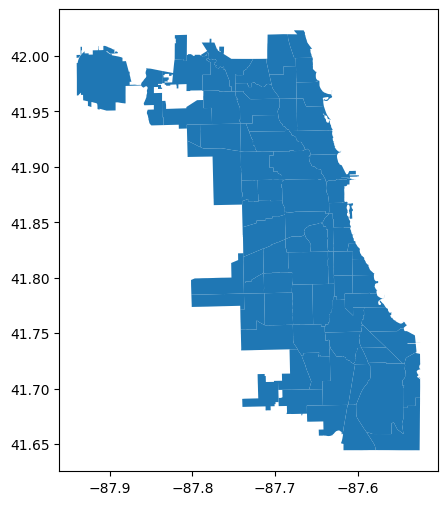

In [40]:
df = gdp.read_file('/content/geo_export_e3f1629d-50a9-4224-90f6-ade2732b28be.shp')
df.plot(figsize=(6, 6))
plt.show()

#**Step2: Import and read csv data from file by using pandas**
Pandas read_csv() function imports/reads a CSV file to DataFrame format. [Pandas read_csv](https://pandas.pydata.org/docs/reference/api/pandas.read_csv.html)




In [41]:
import pandas as pd
df = pd.read_csv("/content/Crimes_-_2021PARINDA.csv")

###**Import dataframe**

In [42]:
df.head() #We can see the first five rows using the head function.

,ID,Case_Number,Date,Block,IUCR,Primary_Type,Description,Location_Description,Arrest,Domestic,...,Ward,Community_Area,FBI_Code,XCoordinate,YCoordinate,Year,UpdatedOn,Latitude,Longitude,Location
0,12571973,JE482457,12/19/2021 7:23,042XX S MOZART ST,460,BATTERY,SIMPLE,SIDEWALK,True,True,...,15.0,58,08B,1158067.0,1876425.0,2021,9/12/2022 16:45,41.816657,-87.695689,"(41.81665685, -87.695688608)"
1,12343475,JE202728,4/16/2021 20:45,056XX N RIDGE AVE,820,THEFT,$500 AND UNDER,OTHER (SPECIFY),False,False,...,48.0,77,6,NaN,NaN,2021,4/23/2021 16:51,NaN,NaN,NaN
2,12602803,JF125633,10/21/2021 11:00,083XX S STONY ISLAND AVE,500E,OTHER OFFENSE,EAVESDROPPING,OTHER (SPECIFY),False,False,...,8.0,45,26,1188260.0,1849805.0,2021,2/27/2022 15:46,41.742941,-87.585783,"(41.74294124, -87.585783412)"
3,12540388,JE444591,11/14/2021 6:00,086XX S COTTAGE GROVE AVE,850,THEFT,ATTEMPT THEFT,CONVENIENCE STORE,False,False,...,6.0,44,6,1183071.0,1847869.0,2021,11/21/2021 15:48,41.737751,-87.604856,"(41.737750767, -87.604855911)"
4,12541139,JE445494,11/14/2021 4:00,034XX W 38TH ST,486,BATTERY,DOMESTIC BATTERY SIMPLE,RESIDENCE,False,True,...,12.0,58,08B,1154073.0,1879187.0,2021,11/21/2021 15:48,41.824317,-87.710266,"(41.824316537, -87.710266215)"


In [43]:
df["Primary_Type"] #access a single column or a single attribute in the data set using the indexing operator

0                            BATTERY
1                              THEFT
2                      OTHER OFFENSE
3                              THEFT
4                            BATTERY
                     ...            
207980            DECEPTIVE PRACTICE
207981    OFFENSE INVOLVING CHILDREN
207982           MOTOR VEHICLE THEFT
207983                 OTHER OFFENSE
207984                         THEFT
Name: Primary_Type, Length: 207985, dtype: object

In [44]:
df.iloc[3, 7] #access specific row and column

'CONVENIENCE STORE'

In [45]:
df.Block.value_counts() #count value

0000X W TERMINAL ST     463
001XX N STATE ST        356
003XX E RANDOLPH ST     320
033XX W FILLMORE ST     301
100XX W OHARE ST        233
                       ... 
072XX W IBSEN ST          1
030XX N Clark St          1
059XX N ODELL AVE         1
064XX N LAKEWOOD AVE      1
015XX W 112TH ST          1
Name: Block, Length: 26985, dtype: int64

In [46]:
df.Block.describe() #statistical describtion

count                  207985
unique                  26985
top       0000X W TERMINAL ST
freq                      463
Name: Block, dtype: object

In [47]:
print(df.Date) #print date

0          12/19/2021 7:23
1          4/16/2021 20:45
2         10/21/2021 11:00
3          11/14/2021 6:00
4          11/14/2021 4:00
                ...       
207980     10/1/2021 10:00
207981       7/1/2021 0:00
207982       8/1/2021 9:00
207983      11/1/2021 0:00
207984      9/30/2021 0:00
Name: Date, Length: 207985, dtype: object


In [48]:
type(df.Date[0]) #check datat type of date

str

#**Step3: Convert to datetime datatype from string to datetime**
Pandas to_datetime() method helps to convert string Date time into Python Date time object. [Pandas.to_datetime](https://pandas.pydata.org/docs/reference/api/pandas.to_datetime.html)

In [49]:
df.Date = pd.to_datetime(df.Date)
df = df.sort_values(by = "Date")
print(df.Date)

207945   2021-01-01 00:00:00
26216    2021-01-01 00:00:00
138707   2021-01-01 00:00:00
19443    2021-01-01 00:00:00
194779   2021-01-01 00:00:00
                 ...        
193891   2021-12-31 23:50:00
193784   2021-12-31 23:55:00
194094   2021-12-31 23:58:00
191820   2021-12-31 23:59:00
195517   2021-12-31 23:59:00
Name: Date, Length: 207985, dtype: datetime64[ns]


###**Clean data by using dropna function**
Drop missing values or drop the rows where at least one element is missing. [Pandas.Dataframe.dropna](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.dropna.html)

In [50]:
df= df.dropna() #deal with NAN values

#**Step4: Generate a heat map for each month**
The relativedelta type is designed to be applied to an existing datetime and can replace specific components of that datetime, or represents an interval of time. [Relativedelta documentation](https://dateutil.readthedocs.io/en/stable/relativedelta.html)

In [51]:
import datetime
from dateutil.relativedelta import relativedelta
print(df.Date.min()) #check min max date of the data
print(df.Date.max())

2021-01-01 00:00:00
2021-12-31 23:59:00


In [52]:
months=[] #create a new list to hold our months'
start = datetime.datetime(2021,1,1) #start from 01/01/2021
while start < df.Date.max(): #loop through these months
  end = start + relativedelta(months=+1)
  mask = (start <= df.Date) & (df.Date<end)
  df_month = df[mask] #set up a series of True/False values that we can use to index our dataframe
  df_month = df_month[["Latitude", "Longitude"]] #we are only interested in the lat/lon values for plotting
  months.append(df_month) #append it to our months list
  start = end #update the start of month date to be the same as the previous end of month
print(months[0]) #print frist month data

         Latitude  Longitude
26216   41.910924 -87.708466
138707  41.883490 -87.750281
19443   41.736227 -87.604811
58090   41.748404 -87.674326
21942   41.820957 -87.601386
...           ...        ...
44870   41.907252 -87.687139
44852   41.933248 -87.755095
44571   41.939077 -87.728527
44601   41.960303 -87.727808
50858   41.726612 -87.603150

[15830 rows x 2 columns]


###**Visualize heatmap by showing individual incidence**
The folium HeatMapWithTime, we need to put the latitude and longitude into a nested list in order to use folium.plugins.HeatMapWithTime to generate the time series heatmap. [folium HeatMapWithTime documentation](https://python-visualization.github.io/folium/plugins.html)

In [53]:
from folium.plugins import HeatMapWithTime
m = folium.Map(Chicagolatlon, zoom_start=11, tiles = 'cartodbdark_matter')
hm = HeatMapWithTime(data = [m.values.tolist() for m in months ],
                     radius = 5,
                     max_opacity=0.5,
                     auto_play = False)
hm.add_to(m)
m

#the map colour did not represent density very well, it shows only single crime incidents at specific lat/lon locations.

#**Step5: Spatially clustered data**

In [54]:
LAT_LON_GRID = 0.005 #impose a grid on top of our map and group the incidents by grid block.
def custom_round(val, resolution): #custom function to round off numbers to the grid resolution
  return round(val/resolution)*resolution
def cluster(df_interval):
  data = df_interval.copy()
  data = custom_round(data, LAT_LON_GRID) #rounding off the data using our custom function.
  data = data.groupby(["Latitude", "Longitude"]).size().reset_index(name = "weight") #groupby function of lat/lon .
  data.weight = data.weight / data.weight.max() #weight data in the range from 0 to 1
  return data
start = datetime.datetime(2021,1,1)
end = start + relativedelta(months=+1)
mask = (start <= df.Date) & (df.Date<end)
df_month = df[mask]
df_month = df_month[["Latitude", "Longitude"]]
  
print(cluster(df_month))

      Latitude  Longitude    weight
0       41.645    -87.615  0.032787
1       41.645    -87.540  0.016393
2       41.650    -87.620  0.049180
3       41.650    -87.615  0.016393
4       41.650    -87.610  0.016393
...        ...        ...       ...
2065    42.020    -87.675  0.475410
2066    42.020    -87.670  0.278689
2067    42.020    -87.665  0.213115
2068    42.025    -87.675  0.049180
2069    42.025    -87.670  0.032787

[2070 rows x 3 columns]


###**Visualize density heatmap**

In [55]:
from folium.plugins import HeatMapWithTime
m = folium.Map(Chicagolatlon, zoom_start=11, tiles = 'cartodbdark_matter')
hm = HeatMapWithTime(data = [cluster(m).values.tolist() for m in months ],
                     radius = 15,
                     max_opacity=1,
                     auto_play = False)

hm.add_to(m)
df = gdp.read_file(shp_path, max_opacity=0.05)
folium.GeoJson(data=df["geometry"], style_function=lambda feature: {
        "weight": 2,
        "dashArray": "5, 5",
        "opacity":0.5}).add_to(m)
m.save("Chicagocrime_Heatmap.html")
m
#this second map was grouped by month and by grid location.